In [1]:
from sklearn import svm
from sklearn import metrics
from sklearn import datasets
from sklearn import model_selection
from sklearn.datasets import make_circles
import os
os. environ['TF_CPP_MIN_LOG_LEVEL'] = '3'
#TF_CPP_MIN_LOG_LEVEL: 텐서 플로우 로그
#0: 모든 로그 출력(default)
#1: INFO 로그 필터
#2: INFO, WARNING 로그 필터
#3: INFO, WARNING, ERROR 로그 필터

import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import numpy as np
from cvxopt import matrix, solvers
import plotly.graph_objects as go
from numba import njit

from sklearn.metrics import (
    accuracy_score,
    roc_auc_score,
    average_precision_score,
    roc_curve,
    precision_recall_curve,
    auc
)

In [2]:
# iris = datasets.load_iris()
# # iris data 불러오기
# X_train, X_test, y_train, y_test = model_selection.train_test_split(iris.data[:100, :2], iris.target[:100], test_size = 0.9, random_state = 40)
# #test_size: iris.data와 iris.target의 데이터 중 60%를 X_test와 y_test에 분배, 나머지 40%를 X_train과 y_train에 분배
# #random_state: iris.data, iris.target의 데이터를 랜덤으로 믹스
# # 즉, 데이터를 랜덤하게 섞은 후 test_size = 0.6에 맞춰서 분배

# y_train = 2 * y_train - 1
# y_test = 2 * y_test - 1

데이터 및 상수 생성

In [3]:
n_train = 50

X, Y = make_circles(n_samples = 200, noise=0.1, random_state = 42)
X_train = X[:n_train, :]
X_test = X[n_train:, :]
y_train = Y[:n_train] 
y_test = Y[n_train:]

y_train = 2 * y_train - 1
y_test = 2 * y_test - 1

N = X_train.shape[0]

Solver 구하기

In [4]:
def Linear_kernel(n, m, X_1, X_2):
    K_train_train = X_1[n, :] @ X_2[m, :].T

    return(K_train_train)

In [5]:
def Solver_SVM (P, q, G, h, A, b):
    sol = solvers.qp(
    matrix(P),
    matrix(q),
    matrix(G),
    matrix(h),
    matrix(A, tc = "d"),
    matrix(b, tc = "d")
    )

    return(sol)

학습

In [6]:
def Solver_Parameter():

    
    I = np.identity(N)
    C = 1e6

    K_train_train = np.zeros((N, N))

    for n in range(N):
        for m in range(N):
            K_train_train[n, m] = Linear_kernel(n, m, X_train, X_train)

    # for n in range(N):
    #     for m in range(N):
    #         K[n, m] = Gaussian_kernel(n, m, gamma,  X_train)

    Y = np.diag(y_train)
    P = Y @ K_train_train @ Y
    q = q = -np.ones((N, 1))

    G = np.vstack([-I, I])
    h = np.hstack([np.zeros(N), C*np.ones(N)])

    A = y_train.astype(float).reshape(1, N)
    b = np.array([0.0])

    return P, q, G, h, A, b, K_train_train

In [7]:
def Linear_Parameter(i, z, X):
    diff = X[i, :] - z 
    return((diff @ diff))

In [8]:
def Linear_HyperPlane(xx, yy, X, y, alpha, b):
    w = (alpha * y) @ X  

    return w[0]*xx + w[1]*yy + b

In [9]:
def b_value(alpha, X, y):
    HP = np.where(alpha > 1e-6)[0]
    HP_margin = np.where((alpha > 1e-6) & (alpha < C - 1e-6))[0]

    y = np.asarray(y_train).reshape(-1)          
    X = np.asarray(X_train, dtype=float)         
    w = X[HP].T @ (alpha[HP] * y[HP])   
    b = np.mean(y[HP_margin] - X[HP_margin] @ w)

    print(f"w = {w}, b = {b}" )
    
    return b

In [10]:
def Train_Graph(alpha, K): 

# 2-D graph############################################################################################################
    h = 0.01
    x_min, x_max = X_train[:, 0].min()-1, X_train[:, 0].max()+1
    y_min, y_max = X_train[:, 1].min()-1, X_train[:, 1].max()+1

    xx, yy = np.meshgrid(np.arange(x_min, x_max, h),
                        np.arange(y_min, y_max, h))

    # b를 모르면 일단 0으로 두고 경계 모양을 먼저 확인 가능
    b = b_value(alpha, X_train, y_train)
    
    Z = Linear_HyperPlane(xx, yy, X_train, y_train, alpha, b=b)

    plt.contourf(xx, yy, Z,
                levels=[Z.min(), 0, Z.max()],
                colors=['#87CEEB', '#8B4513'],
                alpha=0.5)

    plt.contour(xx, yy, Z, levels=[0], colors='k', linewidths=2)  # 결정경계 강조

    plt.scatter(X_train[:, 0], X_train[:, 1], c=y_train, cmap=plt.cm.Paired)

    plt.title('Classic Linear  Train SVM')
    plt.xlim(xx.min(), xx.max())
    plt.ylim(yy.min(), yy.max())
    plt.show()
#######################################################################################################################

# 3-D graph############################################################################################################
    fig = go.Figure()

    fig.add_trace(
        go.Surface(
            x=xx,
            y=yy,
            z=Z,
            colorscale='RdBu',
            opacity=0.85,
            colorbar=dict(title='f(x, y)')
        )
    )


    fig.update_layout(
        title='Classic Linear  Train SVM',
        scene=dict(
            # xaxis_title='Sepal Length',
            # yaxis_title='Sepal Width',
            # zaxis_title='Decision value f(x,y)'
    ))


    fig.show()
#######################################################################################################################


test Data

In [11]:
def Test_evlauation(alpha, K):

    N_train = X_train.shape[0]
    N_test = X_test.shape[0]

    K_train_test = np.zeros((N_train, N_test))

    for n in range(N_train):
        for m in range(N_test):
            K_train_test[n, m] = Linear_kernel(n, m, X_train, X_test)

    scores_test = (alpha * y_train) @ K_train_test + b_value(alpha, C, y_train)

    return scores_test

In [12]:
def Test_Graph(alpha, K):

# 2-D graph############################################################################################################
    h = 0.01

    x_min, x_max = X_test[:, 0].min()-1 , X_test[:, 0].max() + 1
    y_min, y_max = X_test[:, 1].min()-1 , X_test[:, 1].max() + 1

    xx, yy = np.meshgrid(np.arange(x_min, x_max, h), np.arange(y_min, y_max, h))

    grid = np.c_[xx.ravel(), yy.ravel()]  # (N_grid, 2)

    # grid에 대한 decision score f(x) 계산: f(x) = Σ α_i y_i k(x_i, x) + b
    N_train = X_train.shape[0]
    N_grid = grid.shape[0]

    K_train_grid = np.zeros((N_train, N_grid))
    for i in range(N_train):
        for j in range(N_grid):
            K_train_grid[i, j] = Linear_kernel(i, j, X_train, grid)

    scores_grid = (alpha * y_train) @ K_train_grid + b_value(alpha, C, y_train)
    Z = scores_grid.reshape(xx.shape)

    plt.contourf(xx, yy, Z, levels=[Z.min(), 0, Z.max()], colors=['#87CEEB', '#8B4513'], alpha=0.5)
    plt.contour(xx, yy, Z, levels=[0], colors='k', linewidths=2)
    plt.scatter(X_test[:, 0], X_test[:, 1], c=y_test, cmap=plt.cm.Paired)

    plt.title('Classic Linear  Test SVM')
    plt.xlim(xx.min(), xx.max())
    plt.ylim(yy.min(), yy.max())
    plt.show()
#######################################################################################################################

# 3-D graph############################################################################################################
    fig = go.Figure()

    fig.add_trace(
        go.Surface(
            x=xx,
            y=yy,
            z=Z,
            colorscale='RdBu',
            opacity=0.85,
            colorbar=dict(title='f(x, y)')
        )
    )


    fig.update_layout(
        title= 'Classic Linear  Test SVM',
        scene=dict(
            xaxis_title='Sepal Length',
            yaxis_title='Sepal Width',
            zaxis_title='Decision value f(x,y)'
    ))


    fig.show()
#######################################################################################################################

평가

In [13]:
def evaluate_binary_classification(y_true, decision_scores, threshold=0.0):
    y_true = np.asarray(y_true)
    decision_scores = np.asarray(decision_scores)

    # {-1, +1} → {0, 1}
    if set(np.unique(y_true)) == {-1, 1}:
        y_true_bin = (y_true == 1).astype(int)
    else:
        y_true_bin = y_true.astype(int)

    # Accuracy (threshold 기반)
    y_pred = (decision_scores >= threshold).astype(int)
    accuracy = accuracy_score(y_true_bin, y_pred)

    # AUROC / AUPRC (threshold-independent)
    auroc = roc_auc_score(y_true_bin, decision_scores)
    auprc = average_precision_score(y_true_bin, decision_scores)

    return accuracy, auroc, auprc


In [14]:
def Evaluate(alpha, K_train_train):
    acc, auroc, auprc = evaluate_binary_classification(
        y_test,
        Test_evlauation(alpha, K_train_train)
    )

    print("#" * 25)
    print(f"Test Accuracy : {acc:.4f}")
    print(f"Test AUROC    : {auroc:.4f}")
    print(f"Test AUPRC    : {auprc:.4f}")
    print("#" * 25)

    y_true = np.asarray(y_test).ravel()
    if set(np.unique(y_true)) == {-1, 1}:
        y_true = (y_true == 1).astype(int)

    scores = np.asarray(Test_evlauation(alpha, K_train_train)).ravel()

    # ROC 계산
    fpr, tpr, thresholds = roc_curve(y_true, scores)
    roc_auc = auc(fpr, tpr)

    # Plot
    plt.figure(figsize=(6, 6))
    plt.plot(fpr, tpr, lw=2, label=f'ROC curve (AUC = {roc_auc:.4f})')
    plt.plot([0, 1], [0, 1], linestyle='--', color='gray', label='Random')

    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curve (SVM)')
    plt.legend(loc='lower right')
    plt.grid(True)
    plt.show()


코드 조작

     pcost       dcost       gap    pres   dres
 0:  4.7075e+10 -9.0036e+12  9e+12  8e-10  4e-10
 1: -1.3547e+07 -1.0750e+11  1e+11  1e-09  4e-10
 2: -2.3681e+07 -1.1229e+09  1e+09  6e-10  4e-10
 3: -2.4462e+07 -5.8850e+07  3e+07  3e-10  4e-10
 4: -3.8936e+07 -4.6528e+07  8e+06  6e-11  6e-10
 5: -4.1062e+07 -4.3331e+07  2e+06  1e-10  6e-10
 6: -4.2052e+07 -4.2401e+07  3e+05  9e-10  6e-10
 7: -4.2188e+07 -4.2258e+07  7e+04  3e-10  5e-10
 8: -4.2219e+07 -4.2228e+07  9e+03  3e-11  6e-10
 9: -4.2223e+07 -4.2223e+07  1e+02  7e-11  6e-10
10: -4.2223e+07 -4.2223e+07  1e+00  2e-09  6e-10
Optimal solution found.
w = [-0.66377763  0.98118858], b = 0.10626866060061761


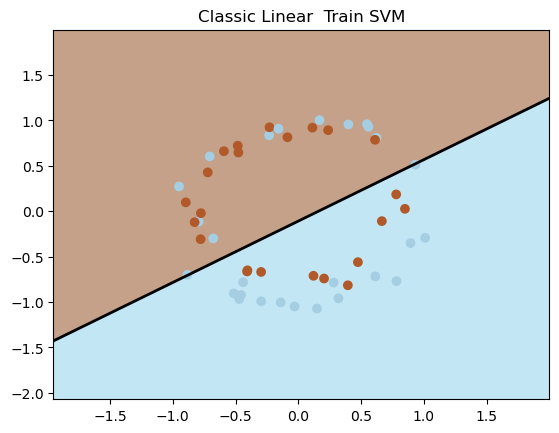

w = [-0.66377763  0.98118858], b = 0.10626866060061761


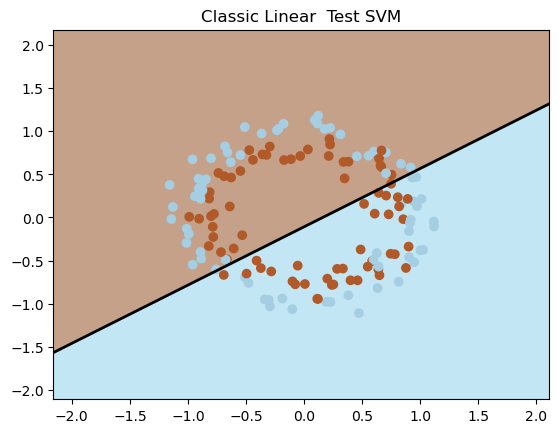

w = [-0.66377763  0.98118858], b = 0.10626866060061761
#########################
Test Accuracy : 0.4733
Test AUROC    : 0.4540
Test AUPRC    : 0.4529
#########################
w = [-0.66377763  0.98118858], b = 0.10626866060061761


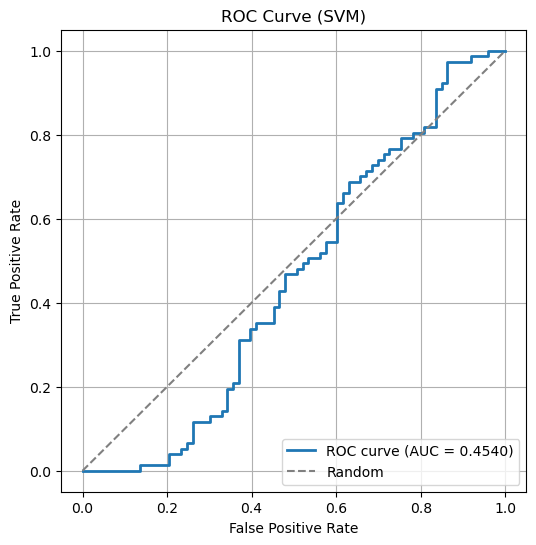

In [ ]:
C = 1110
gamma = 3

P, q, G, h, A, b, K_train_train = Solver_Parameter()

sol = Solver_SVM(P, q, G, h, A, b)

alpha = np.array(sol['x']).reshape(-1)

Train_Graph(alpha, K_train_train)

Test_Graph(alpha, K_train_train)

Evaluate(alpha, K_train_train)